In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
ROOT_DIR = '/content/gdrive/MyDrive/yolo8_verreo_com_rendue/'

In [ ]:
%cd {ROOT_DIR}

/content/gdrive/MyDrive/yolo8_verreo_com_rendue


In [ ]:
!git clone https://github.com/ultralytics/ultralytics.git

fatal: destination path 'ultralytics' already exists and is not an empty directory.


In [ ]:
%cd ultralytics

/content/gdrive/MyDrive/yolo8_verreo_com_rendue/ultralytics


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 73.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
%cd {ROOT_DIR}

/content/gdrive/MyDrive/yolo8_verreo_com_rendue


In [ ]:
!pip install Ipython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.5 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="key")
project = rf.workspace("ai4industry-vxf2e").project("verreo_ai4ind-2")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...


In [ ]:
{dataset.location}

{'/content/gdrive/MyDrive/yolo8_verreo_com_rendue/verreo_ai4ind-2-1'}

## **Entrainement**

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=10 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/gdrive/MyDrive/yolo8_verreo_com_rendue/verreo_ai4ind-2-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, 

## **Validation**

In [ ]:
!yolo task=detect mode=val model={ROOT_DIR}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 11,129,841 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/gdrive/MyDrive/yolo8_verreo_com_rendue/verreo_ai4ind-2-1/valid/labels.cache... 367 images, 2 backgrounds, 0 corrupt: 100% 367/367 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 8, len(boxes) = 367. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 23/23 [05:30<00:00, 14.35s/it]
                   all        367        367      0.751      0.725       0.68      0.413
                Amorim         51         51      0.938       0.98      0.989      0.579
                  Diam          2          2          1          0      0.137      0.107
      

## **Prédire**

In [ ]:
!yolo task=detect mode=predict model={ROOT_DIR}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images


/bin/bash: line 1: yolo: command not found


In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image as imgshow
import os
from IPython.display import display

### **Prédictions**

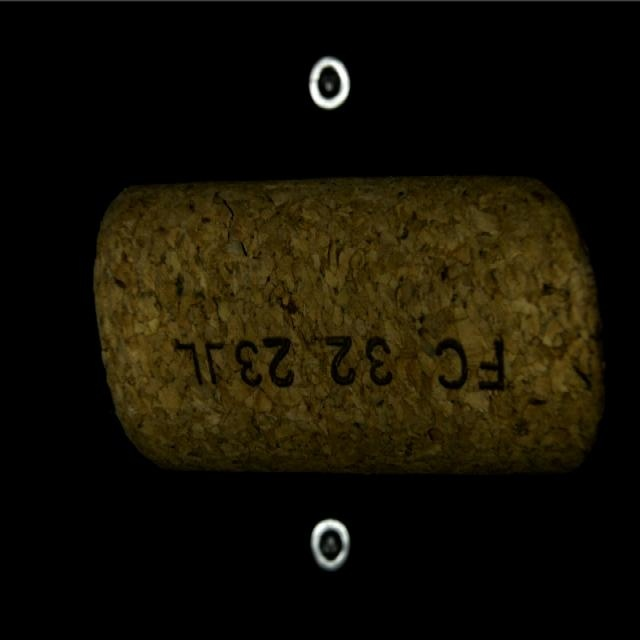

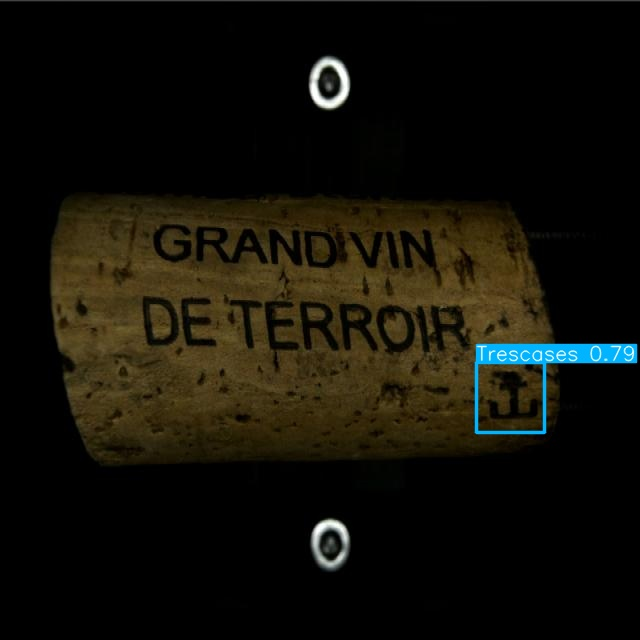

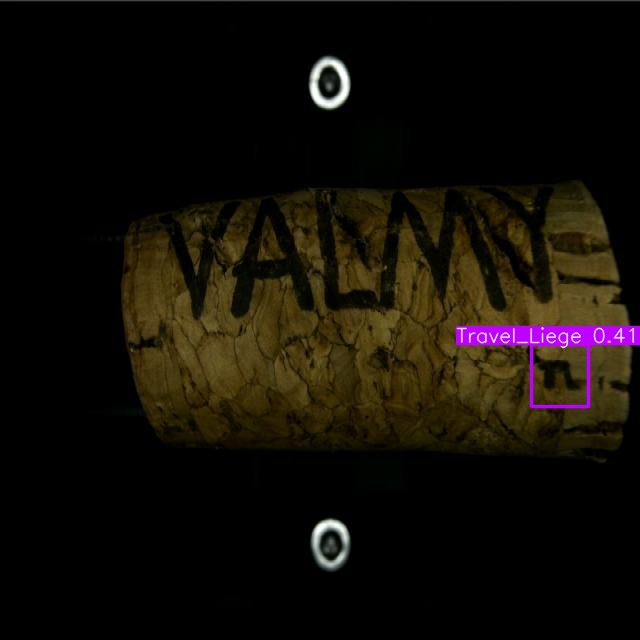

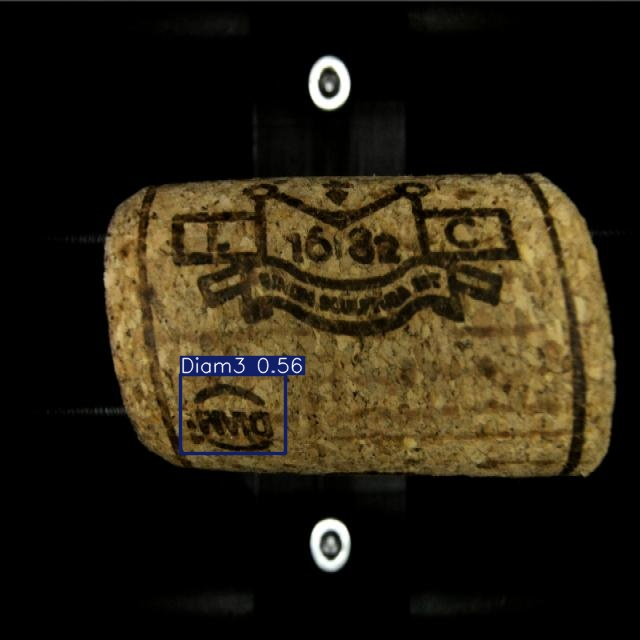

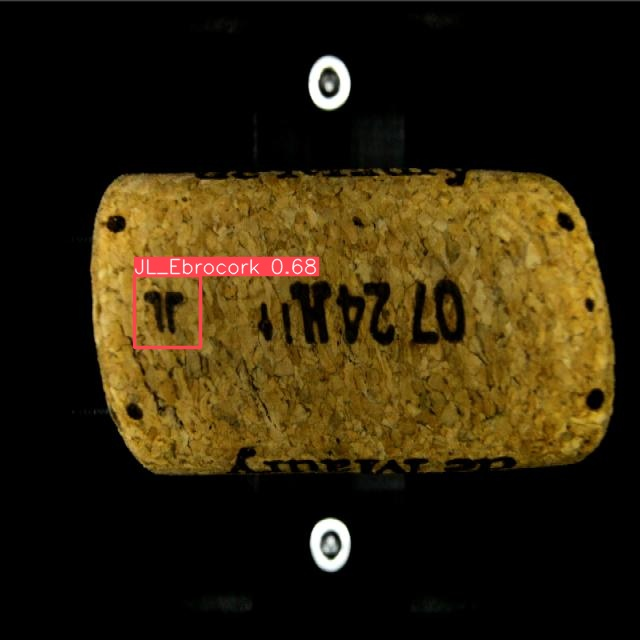

...

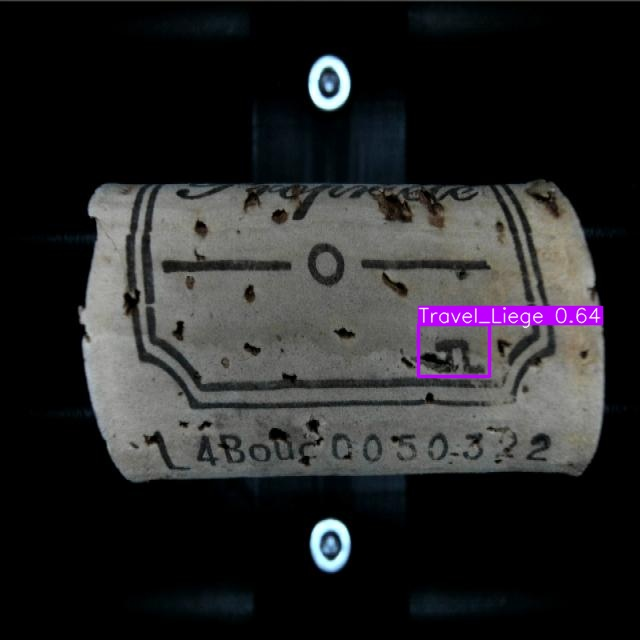

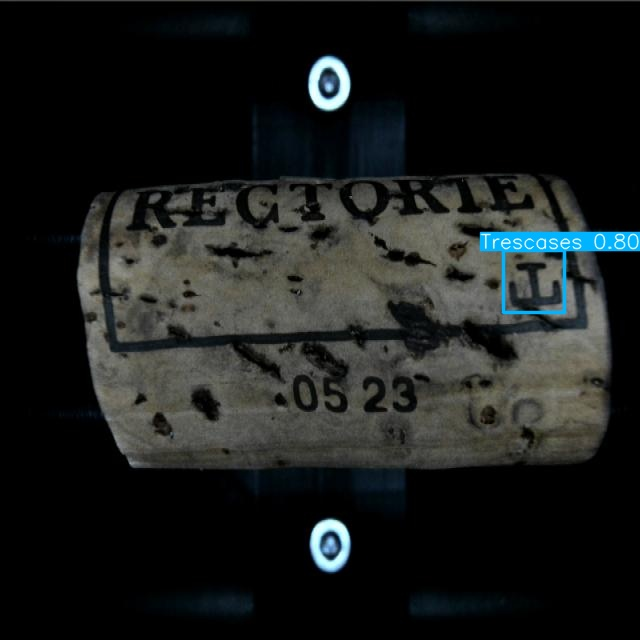

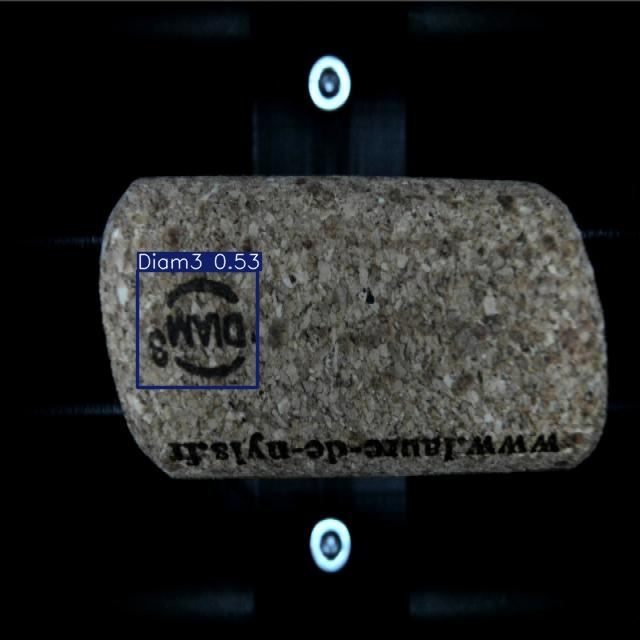

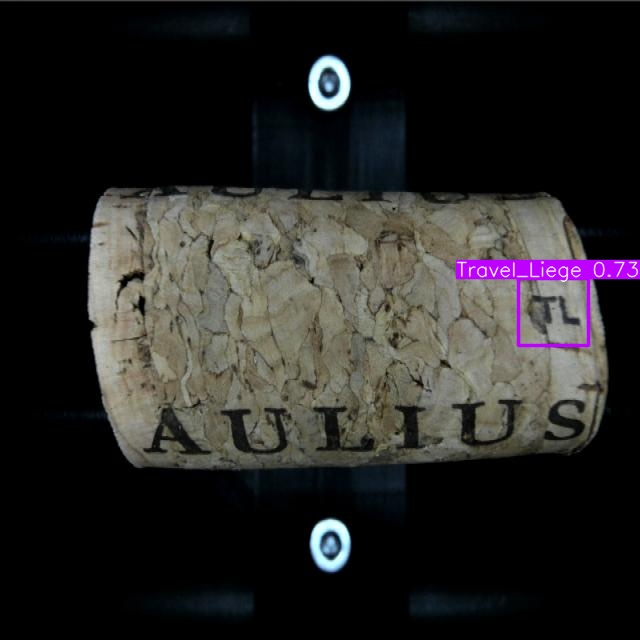

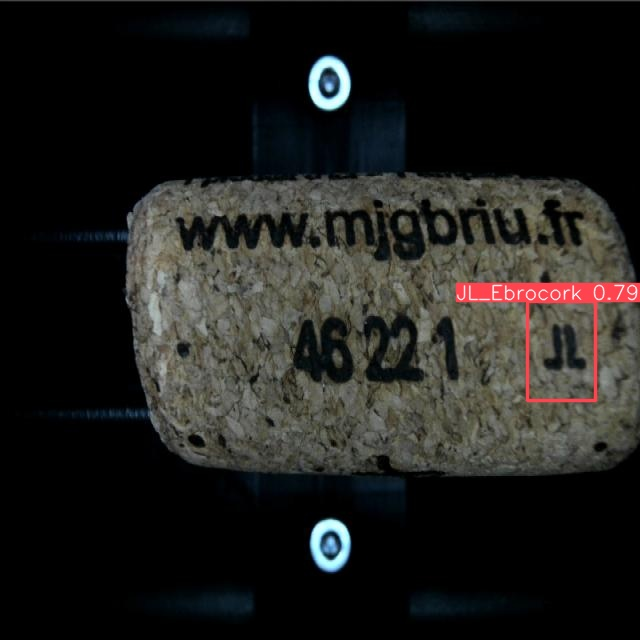

In [ ]:
# Chemin du dossier contenant les images prédites
predictions_folder = os.path.join(ROOT_DIR, "runs/detect/predict")

# Lister toutes les images dans le dossier
image_files = [f for f in os.listdir(predictions_folder) if f.endswith(('.jpg', '.png', '.bmp'))]

# Afficher toutes les images
for image_file in image_files:
    image_path = os.path.join(predictions_folder, image_file)
    display(imgshow(image_path, width=600))


## **Validation**

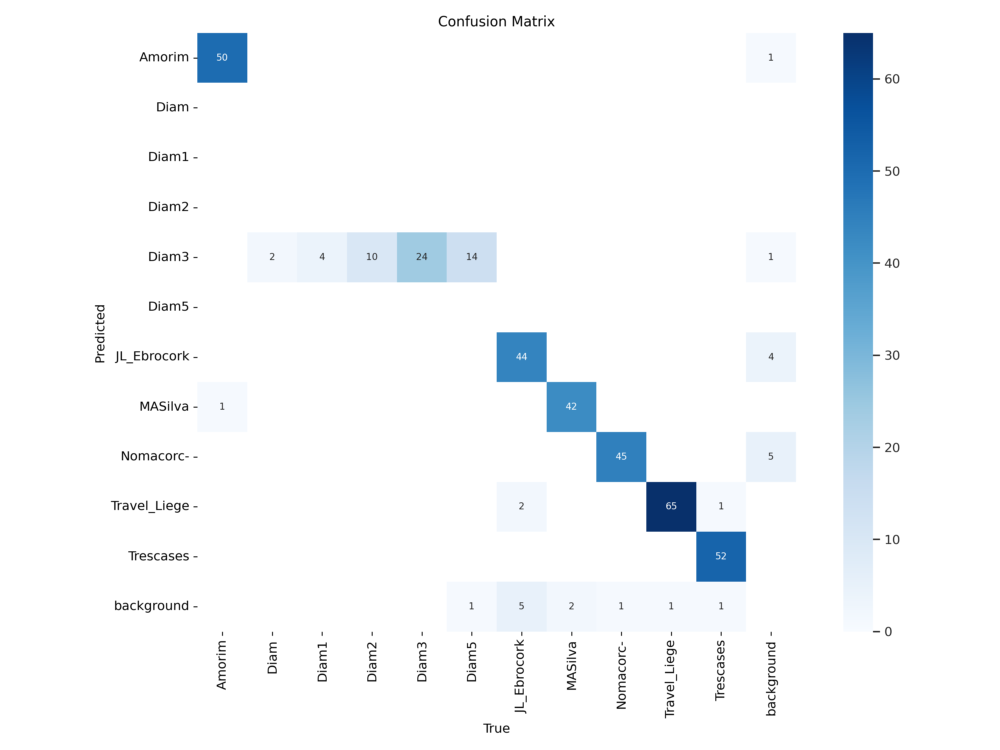

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/confusion_matrix.png"), width = 600)

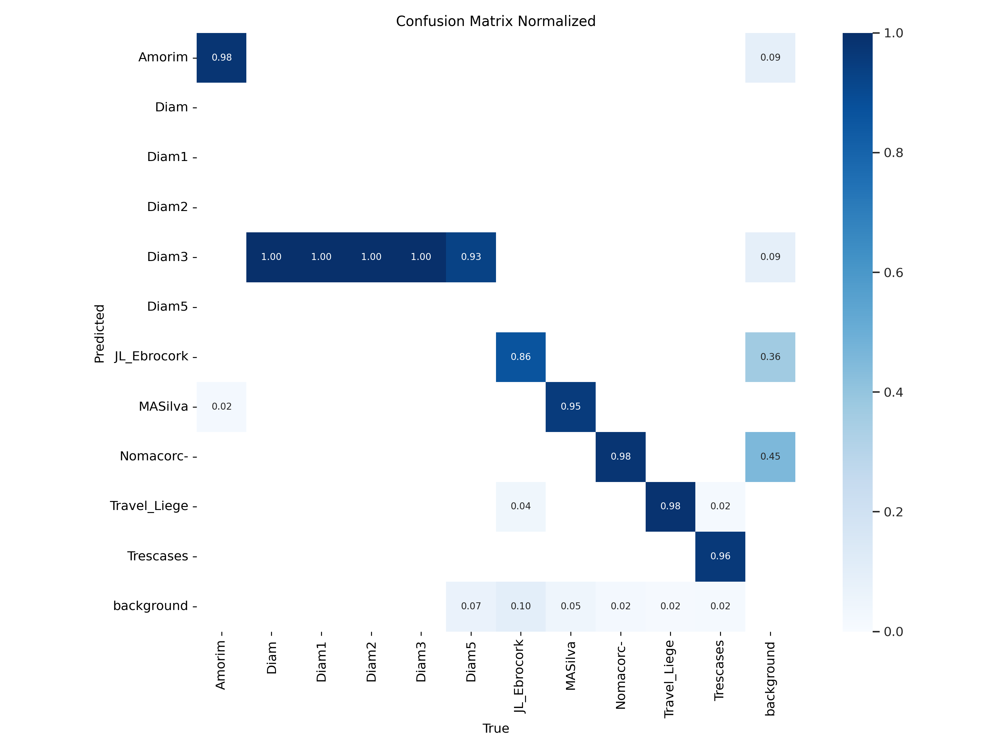

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/confusion_matrix_normalized.png"), width = 600)

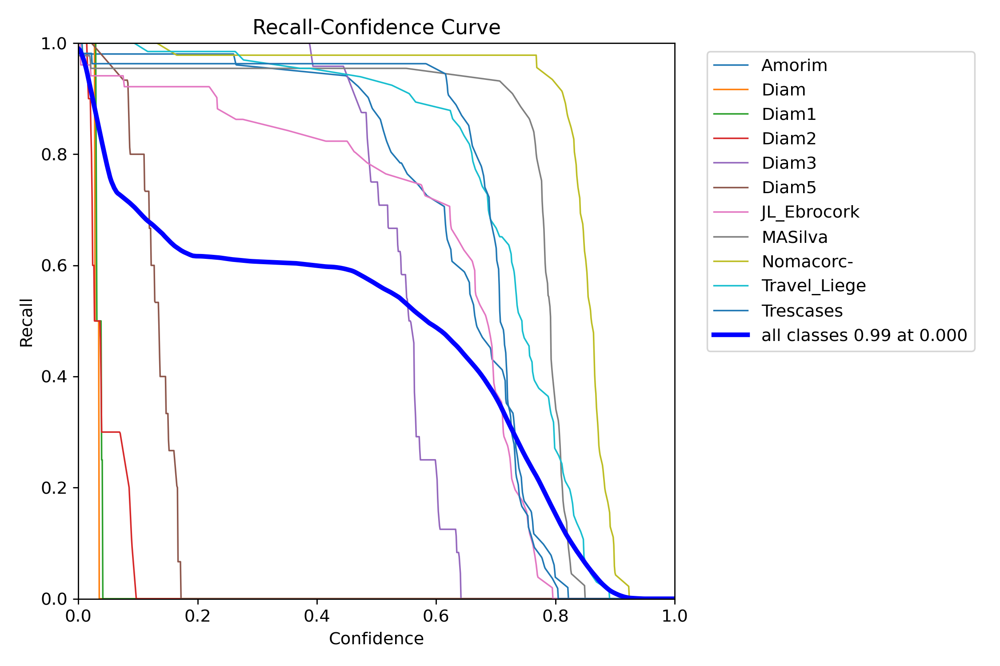

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/R_curve.png"), width = 600)

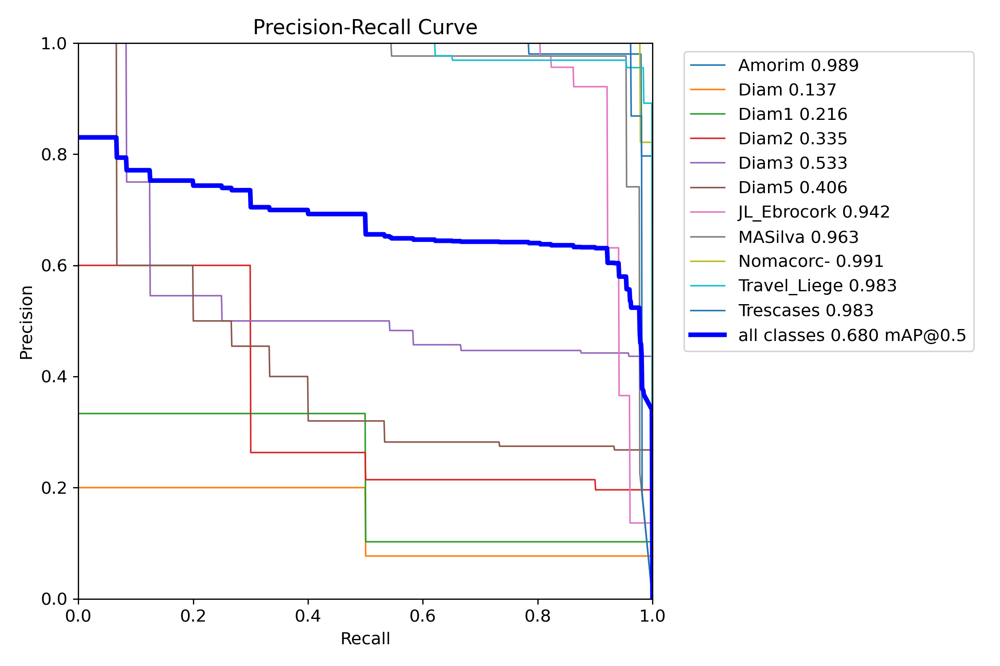

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/PR_curve.png"), width = 600)

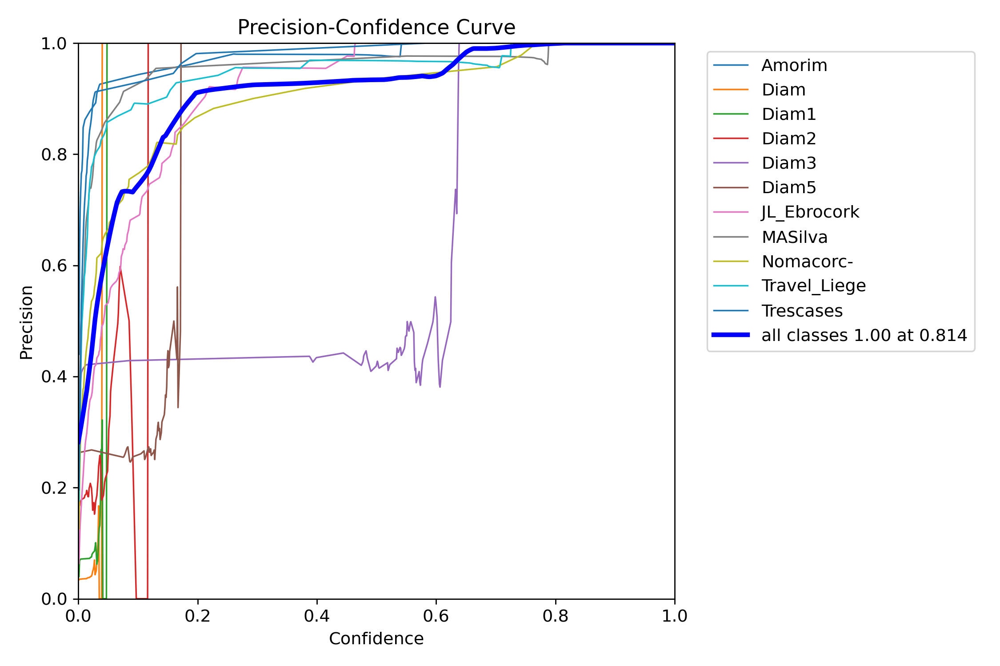

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/P_curve.png"), width = 600)

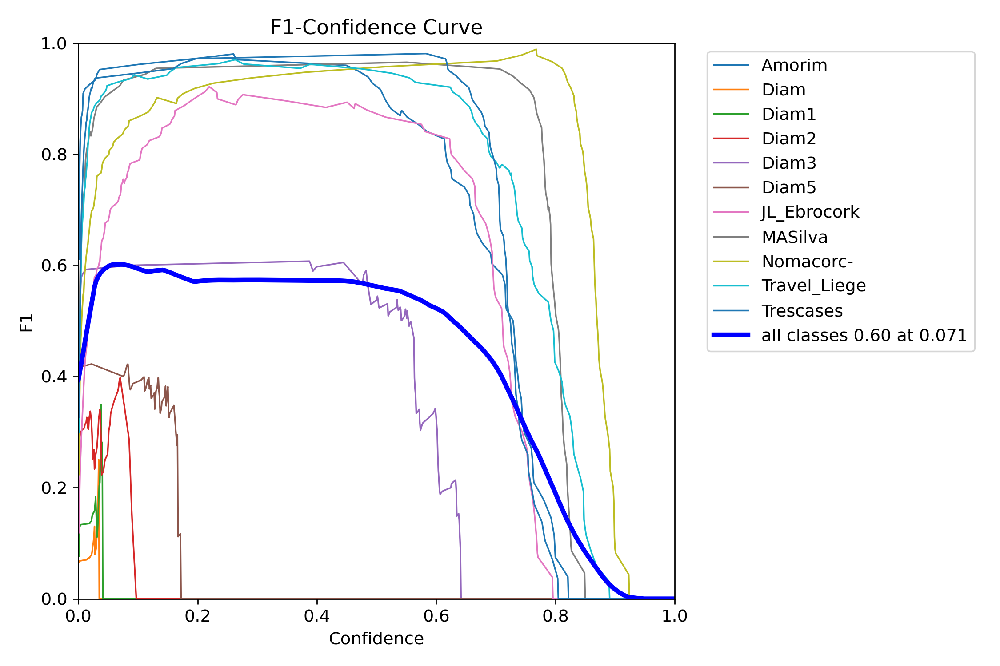

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/val/F1_curve.png"), width = 600)

## **Entrainement**

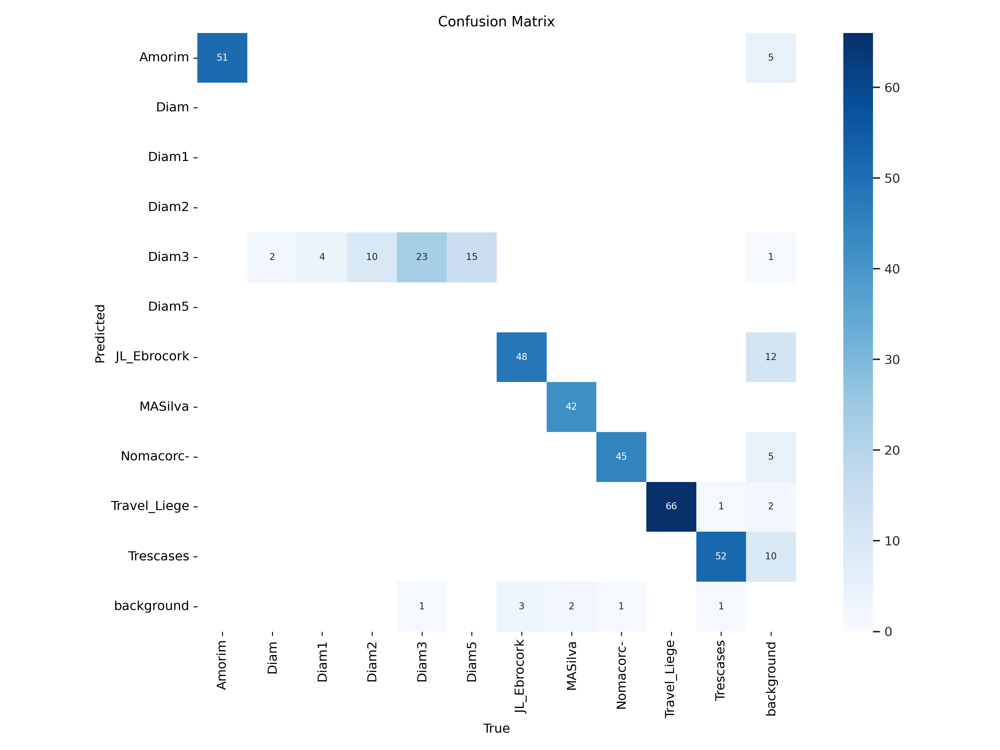

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/confusion_matrix.png"), width = 600)

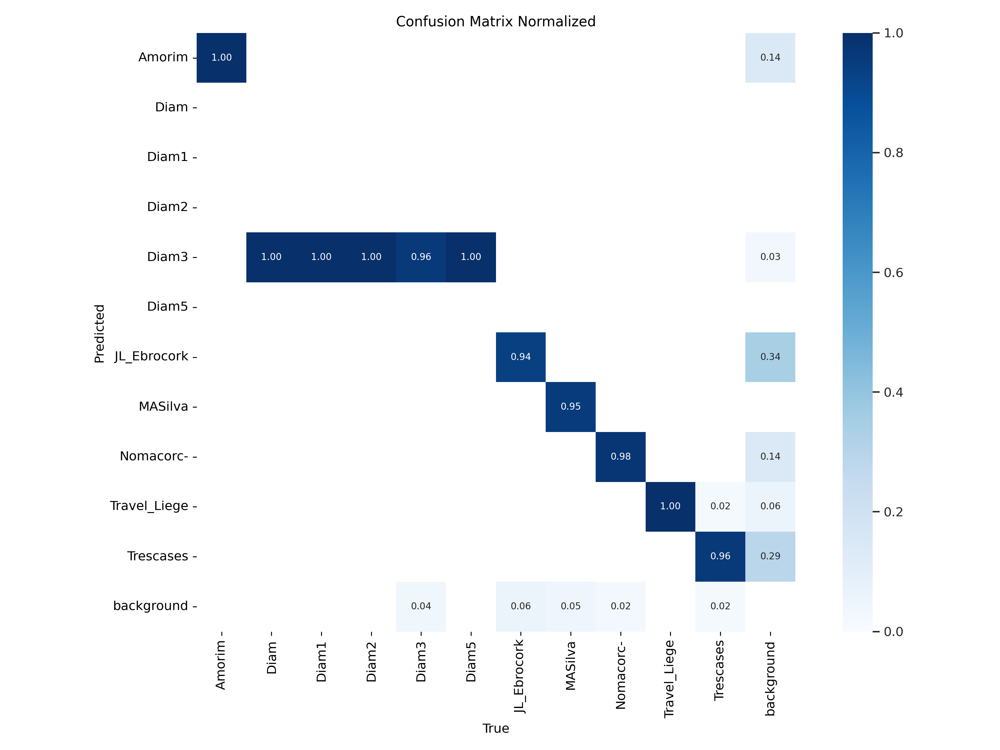

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/confusion_matrix_normalized.png"), width = 600)

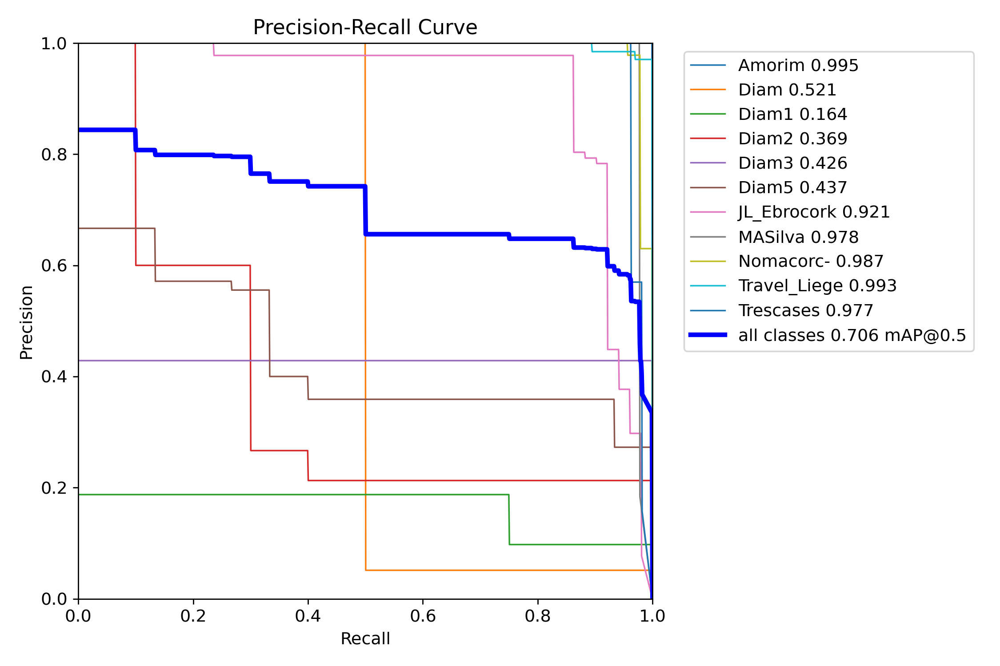

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/PR_curve.png"), width = 600)

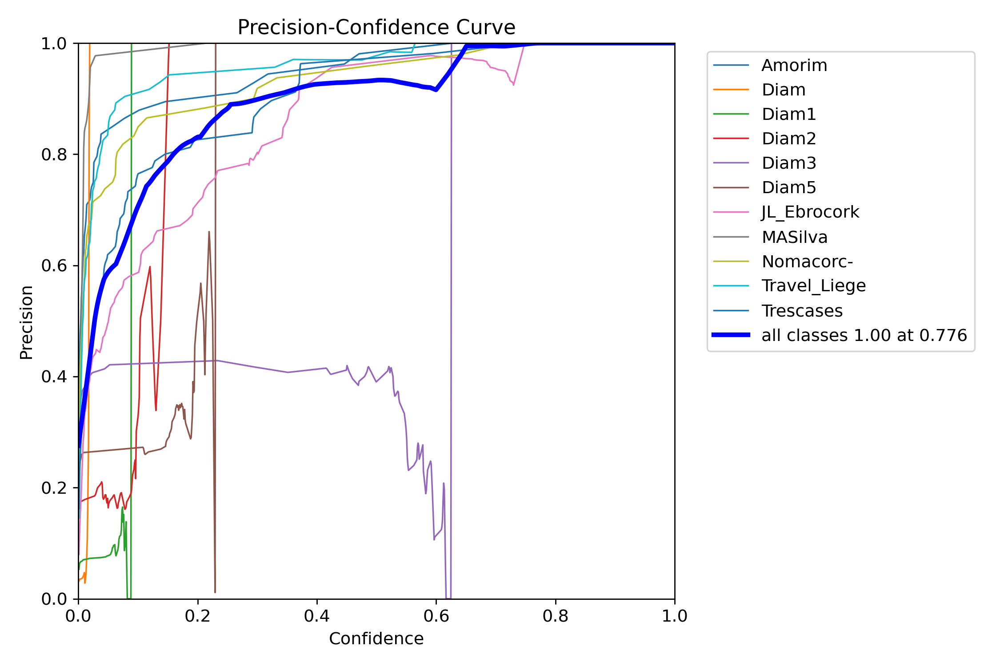

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/P_curve.png"), width = 600)

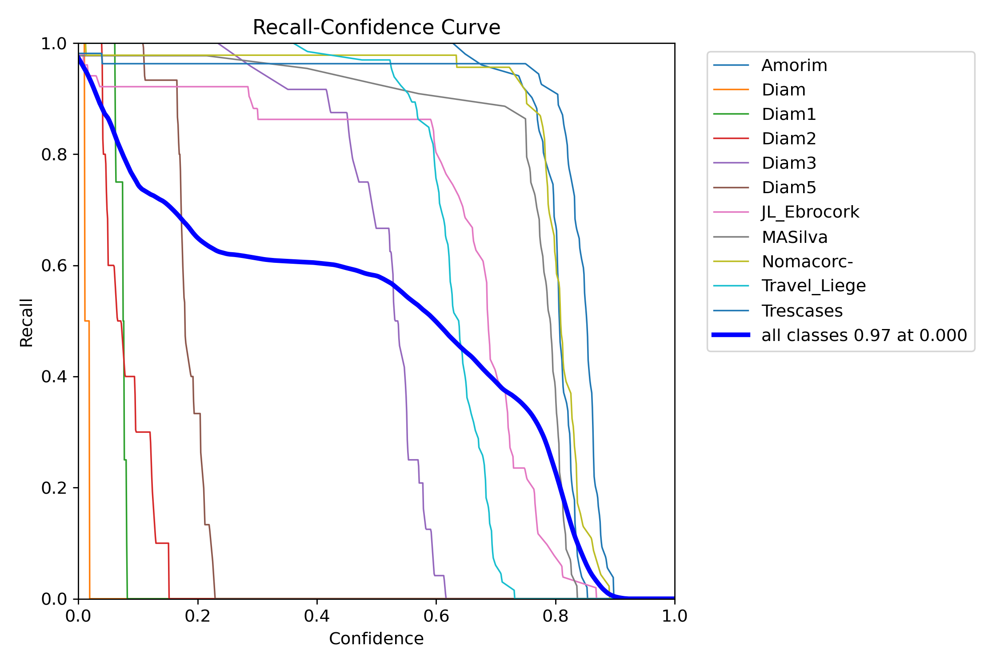

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/R_curve.png"), width = 600)

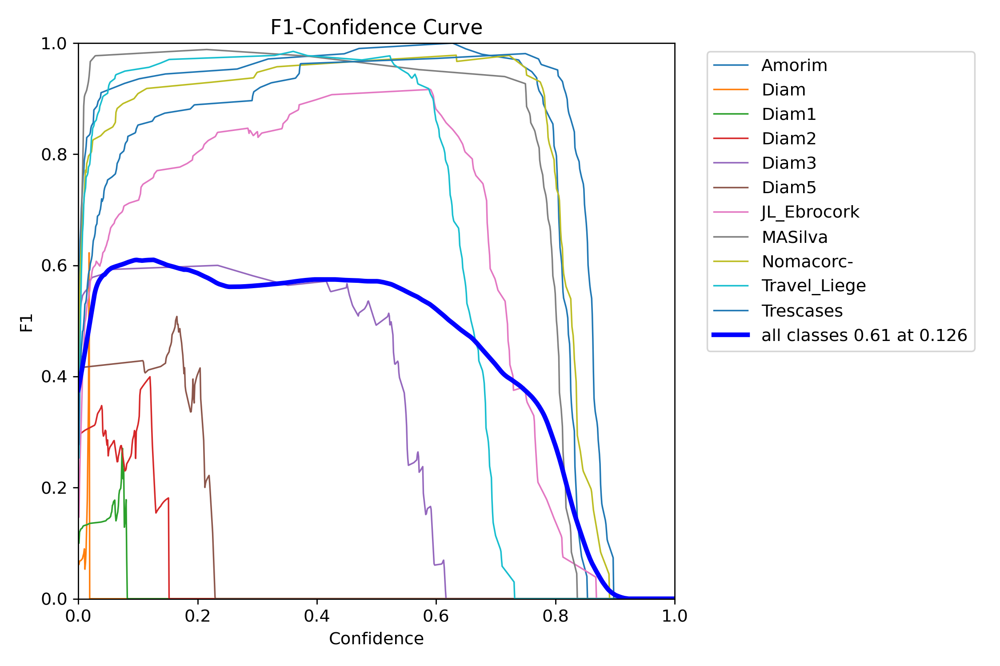

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/F1_curve.png"), width = 600)

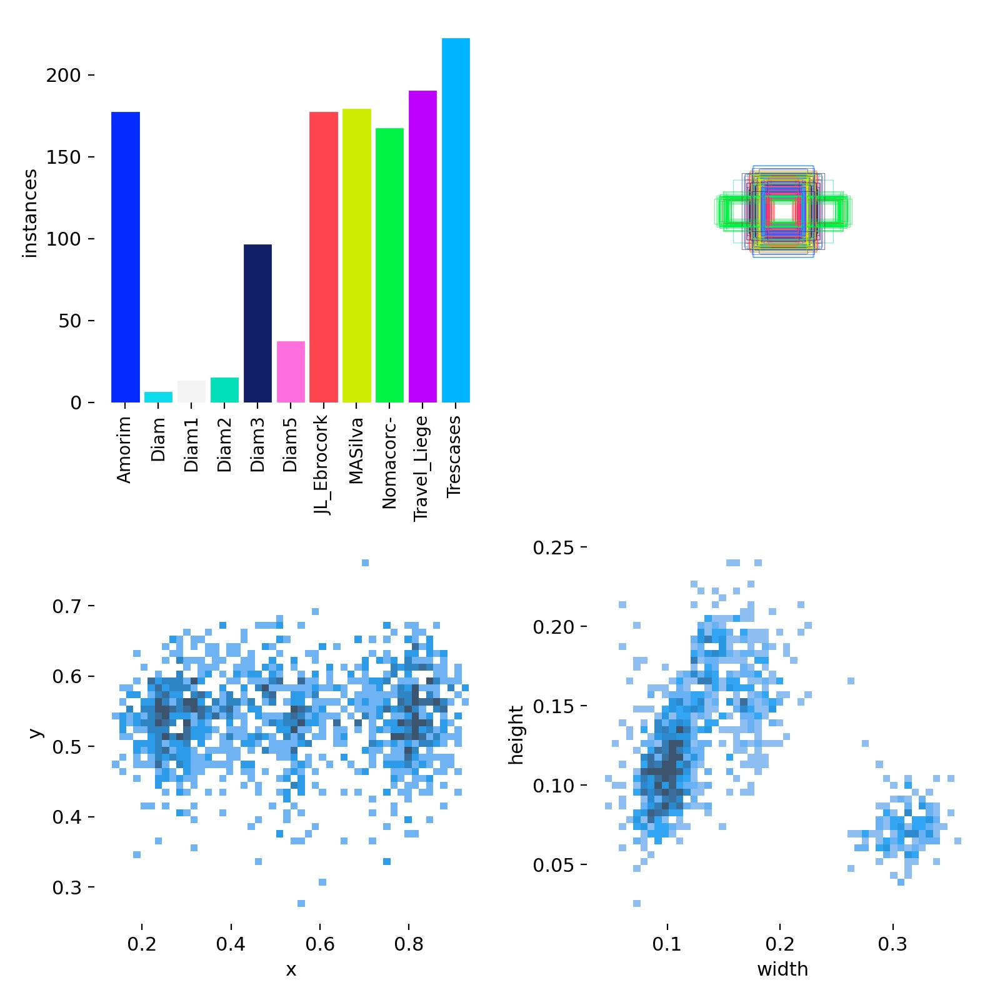

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/labels.jpg"), width = 600)

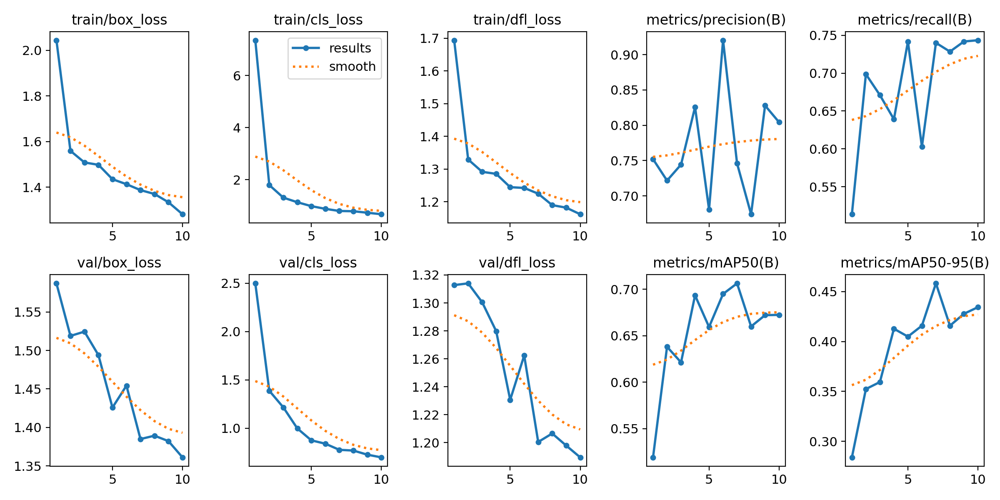

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/results.png"), width = 600)

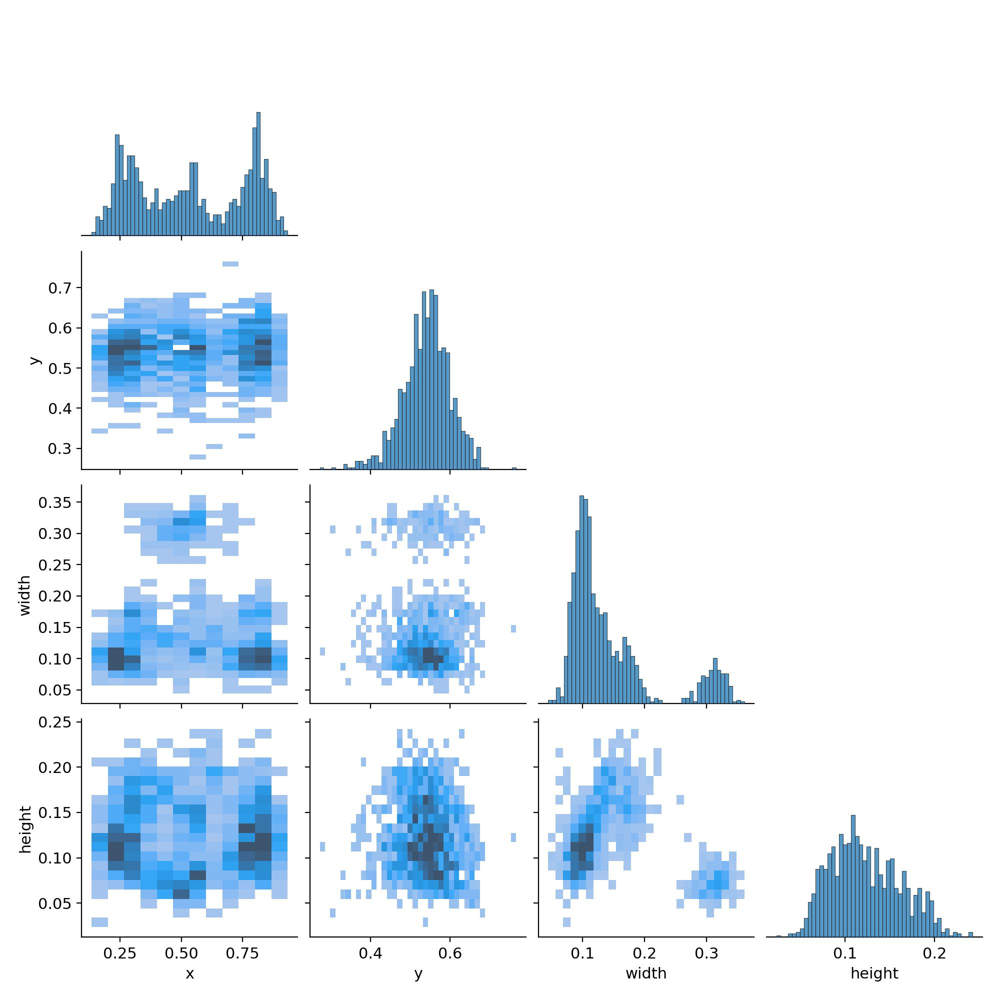

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/train2/labels_correlogram.jpg"), width = 600)